<h1><center>
    ECE 438: Digital Signal Processing with Applications<br/>
    Lab 3: Frequency Analysis<br/>
    <small>Date:</small><br/>
    <small>Section:</small><br>
</center></h1>

|Name |Signature |Time spent outside lab|
|:---:|:---:|:---:|
|Student Name #1 [---%]| | |
|Student Name #2 [---%]| | |

||Below expectations| Lacks in some respect|Meets all expectations|
|:---:|:---:|:---:|:---:|
|**Completeness of the report**||||
|**Organization of the report**||||
|**Quality of figures**: *Correctly labeled with title, x-axis, y-axis, and name(s)*||||
|**Ability to compute Fourier series expansion and synthesize periodic signals using the expansion in Simulink (26 pts)**: *Derivation and sketch, plots of synthesized signals, questions*||||
|**Understanding of modulator and CT system analysis (26 pts)**: *Output plots, questions*||||
|**Implementation of DTFT (21 pts)**: *Python function, DTFT’s magnitude and phase plots*||||
|**DT system analysis (27 pts)**: *Exercises in 5.2, completed block diagram, table of measurements, impulse and frequency response*||||

In [2]:
import numpy as np
import matplotlib.pyplot as plt

In [3]:
# make sure the plot is displayed in this notebook
%matplotlib inline
# specify the size of the plot
plt.rcParams['figure.figsize'] = (16, 6)

# for auto-reloading extenrnal modules
%load_ext autoreload
%autoreload 2

<h3 style="color:red;"><left>Exercise 2.1</left></h3>

**1. For each of these two signals, do the following on a blank sheet of paper (or type the equations in the Markdown cell if you are familiar with LaTex):**
* **Compute the Fourier series expansion in the form**
\begin{equation}
    s(t)=a_0+\sum_{k=1}^\infty A_k\sin(2\pi kf_0t+\theta_k)
\end{equation}
where $f_0=\frac{1}{T_0}$.

    **Hint :**You may want to use one of the following references:

    Sec. 4.1 of “Digital Signal Processing”, by Proakis and Manolakis, 1996;

    Sec. 4.2 of “Signals and Systems”, by A. Oppenheim and A. Willsky, 1983;

    Sec. 3.3 of “Signals and Systems”, A. Oppenheim and A. Willsky, 1997.

    Note that in the expression above, the function in the summation is $\sin(2\pi kf_0 t + \theta k )$, rather than a complex sinusoid. The formulas in the above references must be modified to accommodate this. You can compute the cos/sin version of the Fourier series, then convert the coefficients.

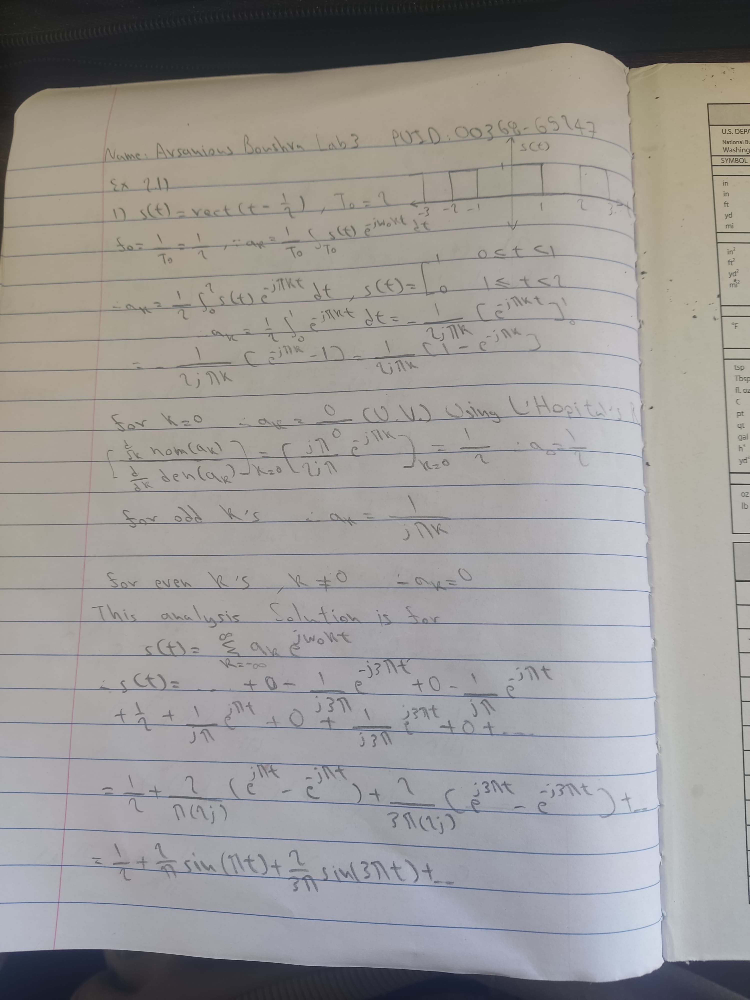 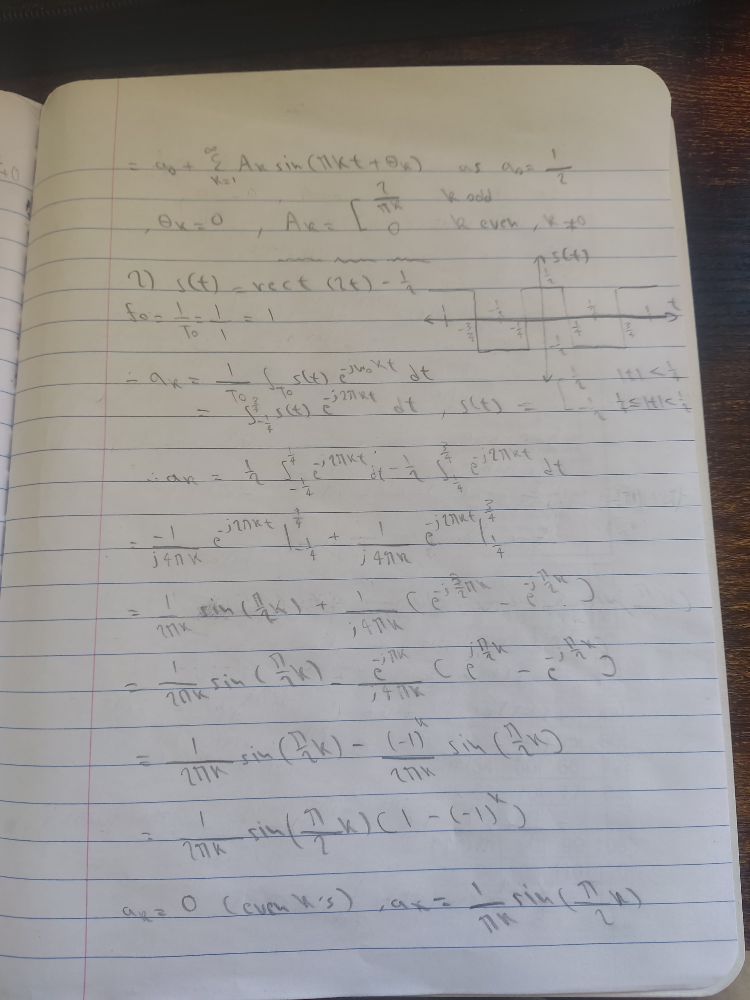 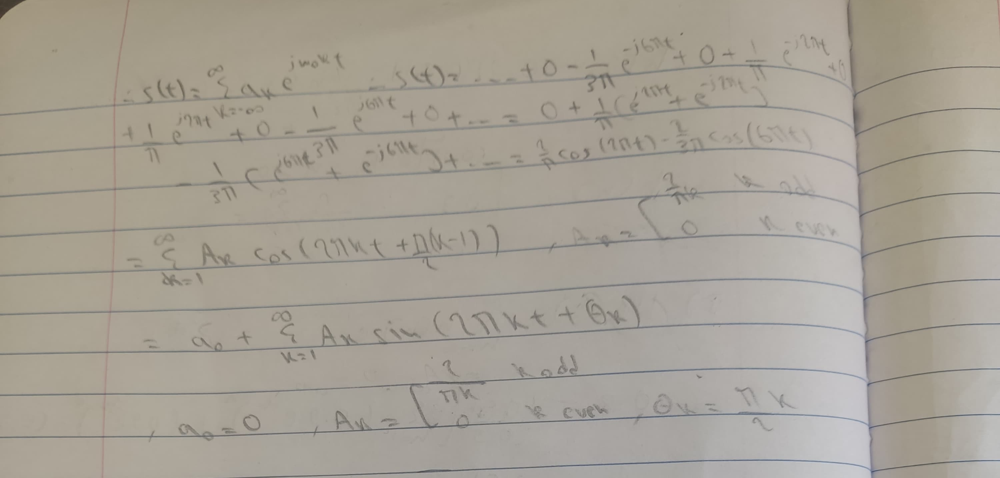

**2. Write code to approximate the two signals using the Fourier series expansion above. Use 200 (instead of infinite number of) Sine waves. Then, plot these two signals.**

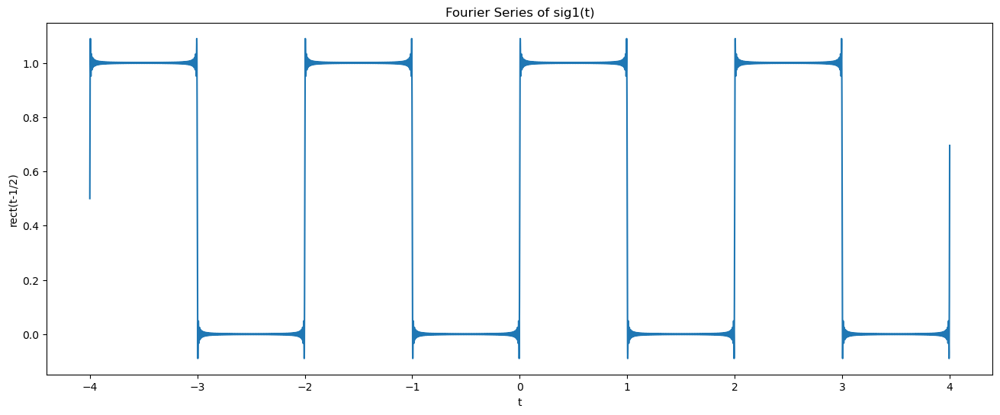

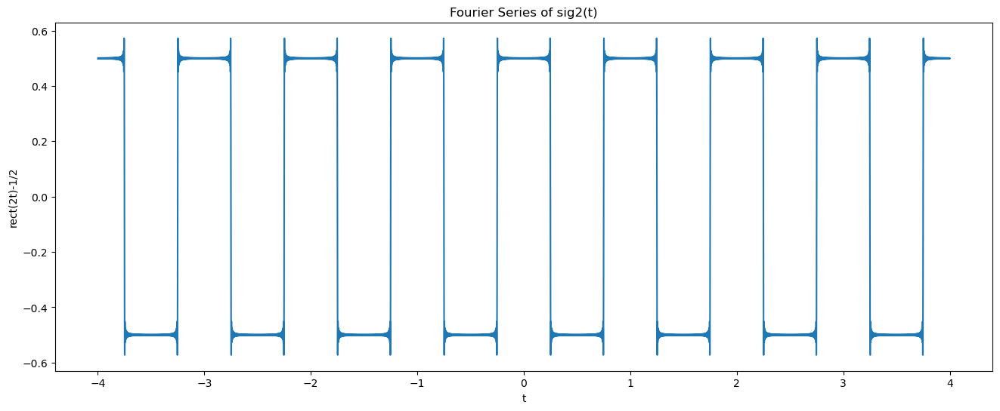

In [4]:
t=np.arange(-4,4+0.001,0.001)
N=200
sig1=np.full(len(t),1/2)
for k in range(1,N+1,2):
        sig1=sig1+(2/(np.pi*k))*np.sin(np.pi*k*t)
plt.plot(t,sig1)
plt.xlabel("t")
plt.ylabel("rect(t-1/2)")
plt.title("Fourier Series of sig1(t)")
plt.show()

sig2=np.full(len(t),0)
for k in range(1,N+1,2):
        sig2=sig2+(2/(np.pi*k))*np.sin(2*np.pi*k*t+(np.pi/2)*k)
plt.plot(t,sig2)
plt.xlabel("t")
plt.ylabel("rect(2t)-1/2")
plt.title("Fourier Series of sig2(t)")
plt.show()


<h3 style="color:red;"><left>Exercise 4.1</left></h3>

**1. Hand in plots of the Spectrum Analyzer output for each of the three synthesized waveforms.** 

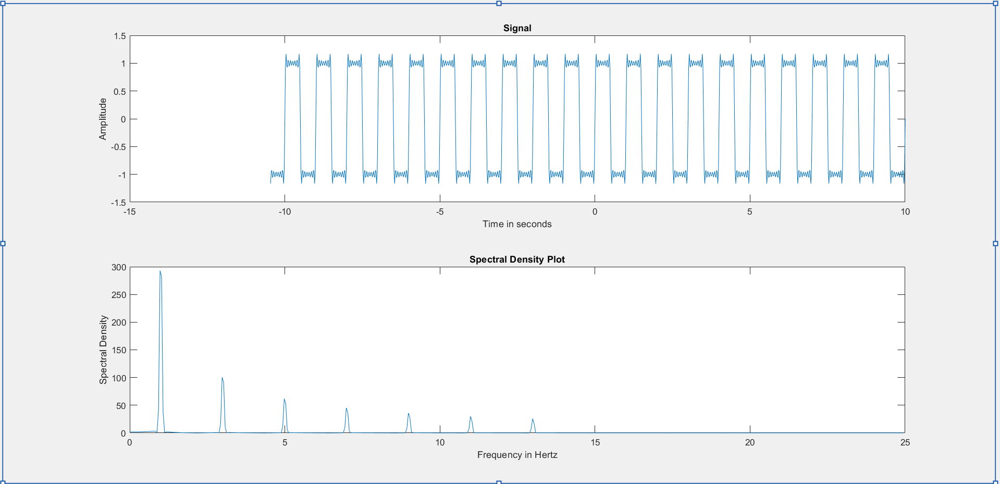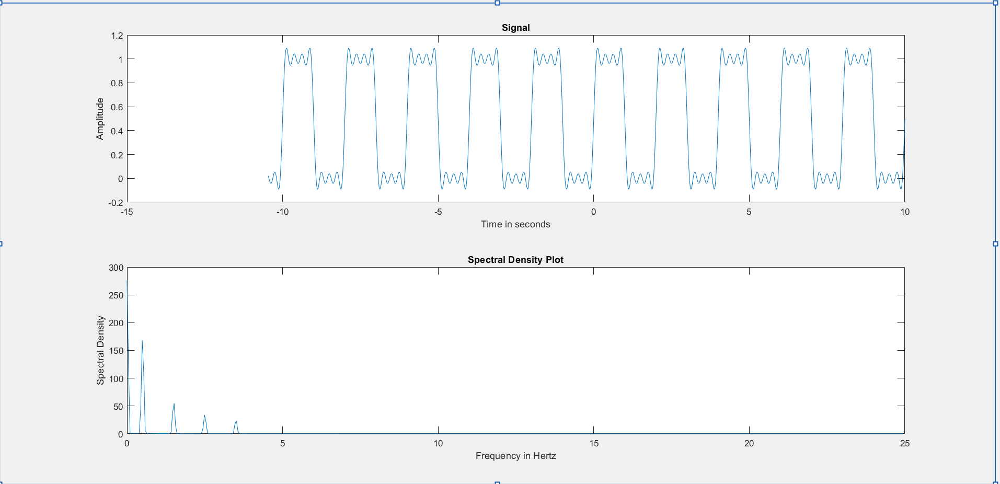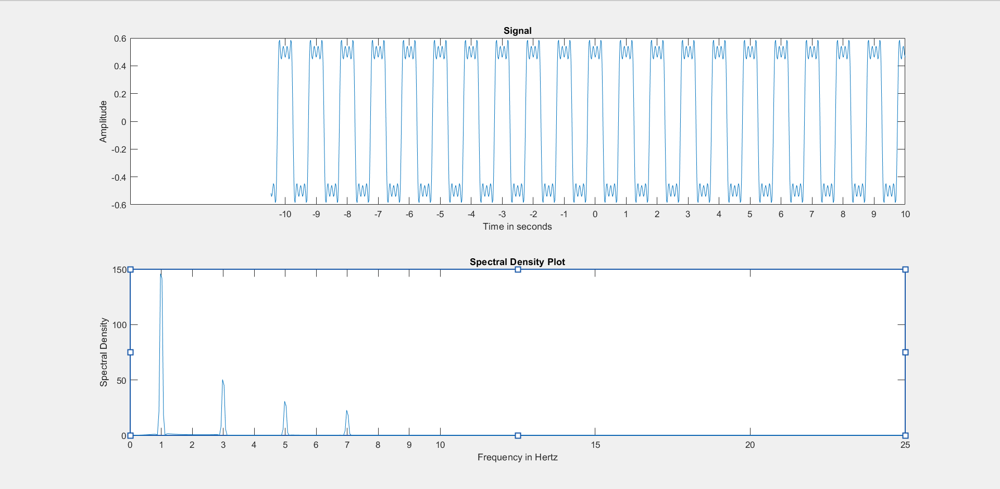

**2. For each case in Q1, comment on how the synthesized waveform differs from the desired signal,and on the structure of the spectral density.**

Case 1: the symthesized wave form has various values (sinousoids) not 1 and 0 like the desired signal
spectrual denisty consists of decreasing peaks and at zero (DC) and muliples of 1 hz frequencies
Case 2: the symthesized wave form has various values (sinousoids) not 1 and 0 like the desired signal
spectrual denisty consists of decreasing peaks and at  zero (DC) and 1,3,5,7 frequencies respectively
Case 1: the symthesized wave form has various values (sinousoids) not 1 and 0 like the desired signal
spectrual denisty consists of decreasing peaks and at zero (DC) and 1,3,5,7 frequencies respectively


<h3 style="color:red;"><left>Exercise 4.2</left></h3>

**1. Hand in plots of the output of the *Spectrum Analyzer* for each signal.**

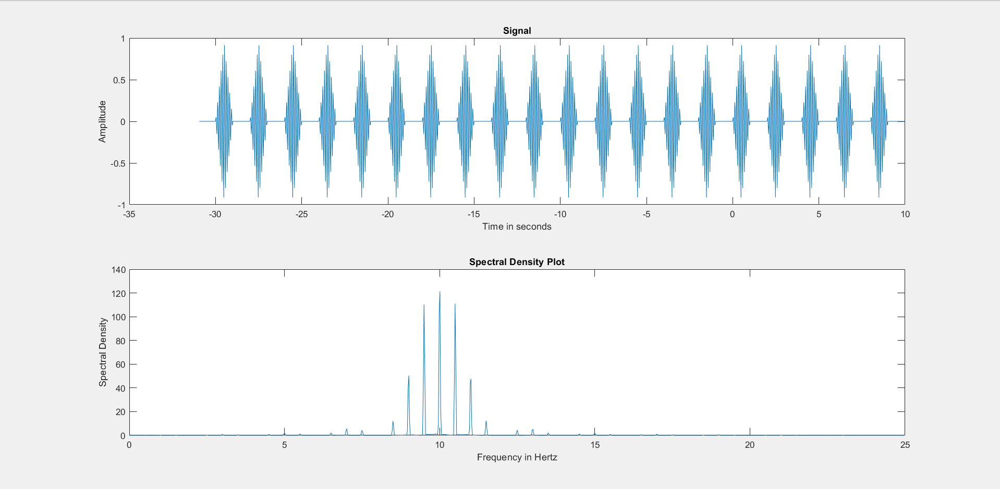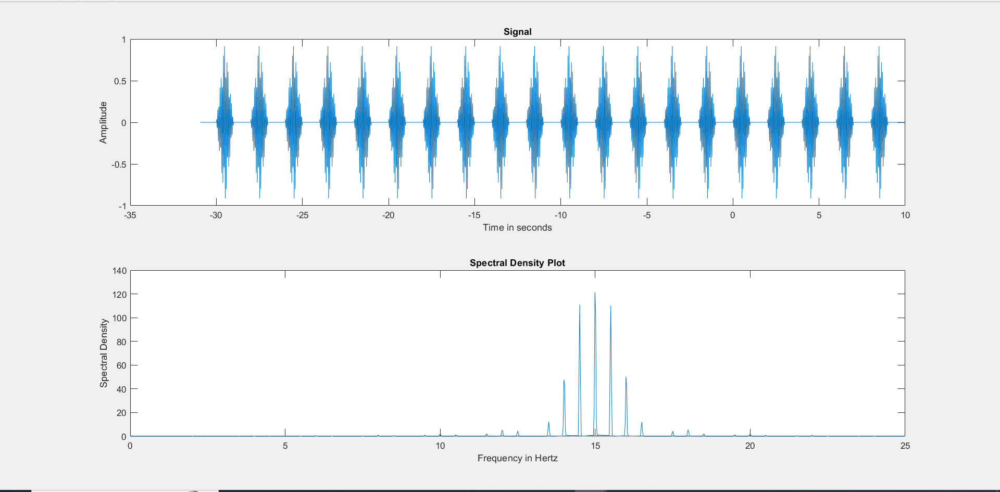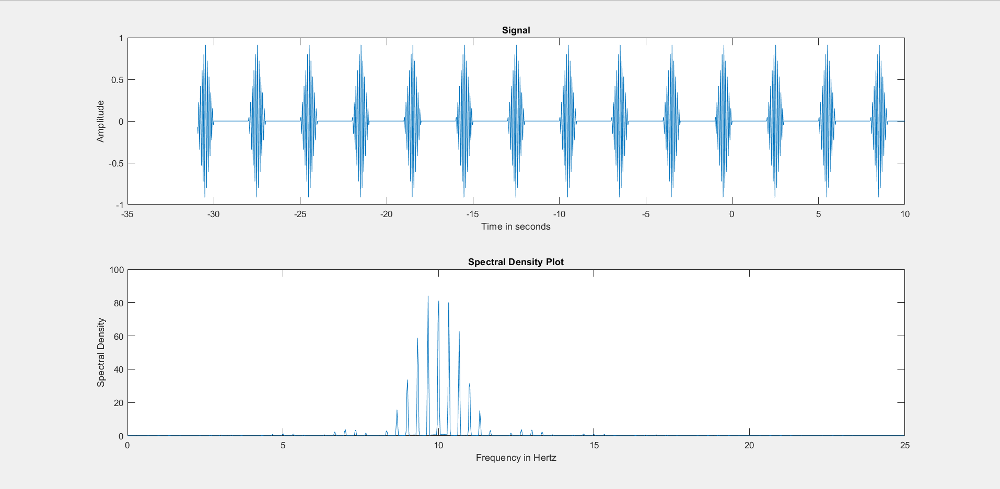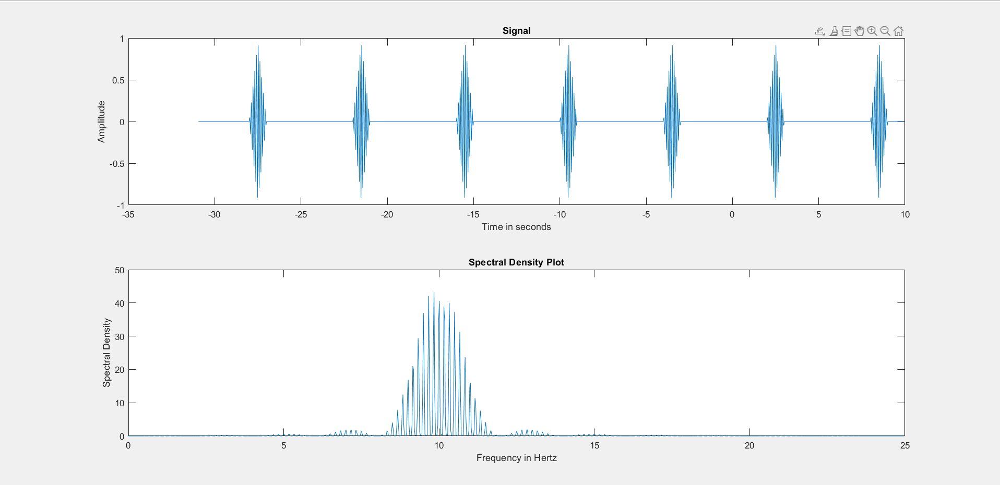

**2. What effect does changing the modulating frequency have on the spectral density?**

changing the center frequency to 15 Hz instead of 10 Hz

**3. Why does the spectrum have a comb structure and what is the spectral distance between impulses? Why?**

because the signal is periodic, 1/T which in the original signal 1/2, because when apply FT the exponentials in time domain shifted our spectrum in the frequency domain by a frequency distance (1/T)

**4. What would happen to the spectral density if the period of the triangle pulse were to
increase toward infinity? (in the limit)**  

There will be no distance between the impulses in the spectral denisty. It will be continious. 

<h3 style="color:red;"><left>Exercise 4.3</left></h3>

**1. Hand in the printout of the output of the Network Analyzer (magnitude and phase of the
frequency response, and the impulse response).**

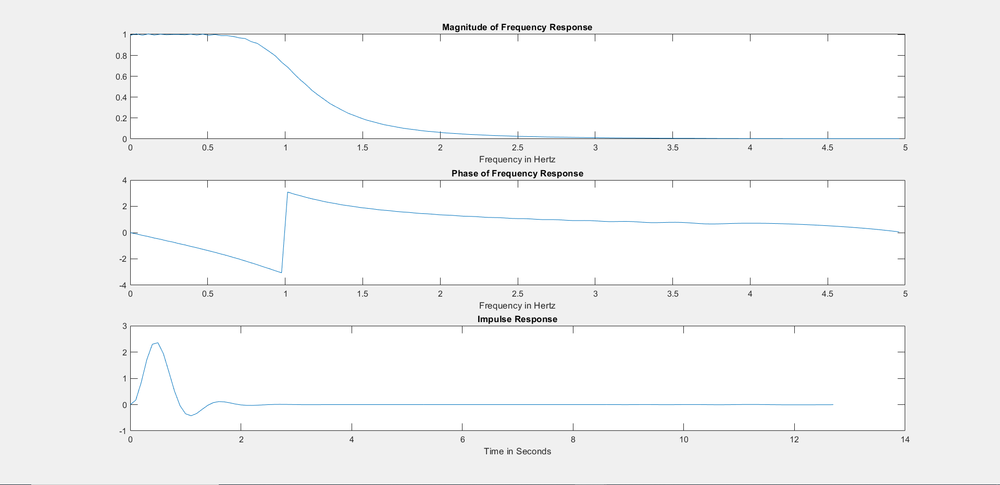

**2. Hand in the plot of the impulse response obtained using a unit step.**

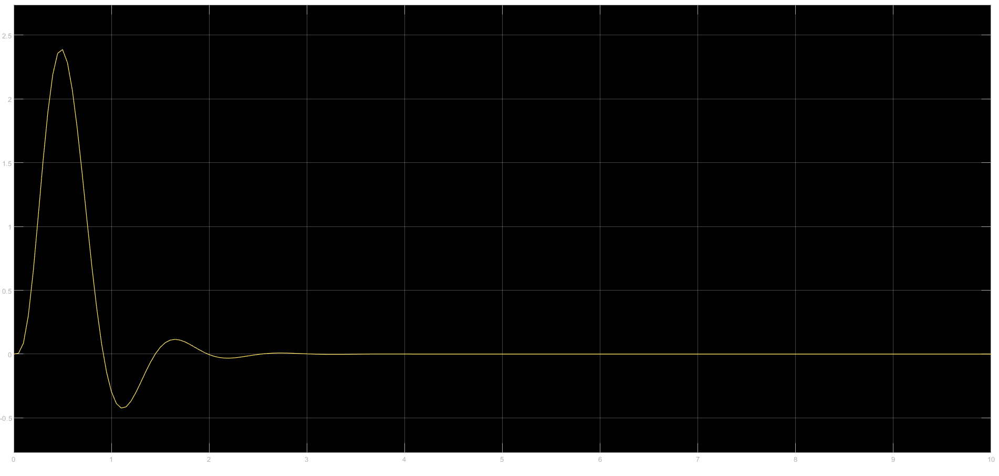

**3. What are the advantages and disadvantages of each method?**

1- 1st Method: 
Adv: give the both frequency response and impulse response 
DisAdv: takes long time
2- Second Method:
Adv: it take small time
DisAdv: it provides only the impulse response.

<h3 style="color:red;"><left>Exercise 5.1</left></h3>

**1. Complete the follwing function that computes the DTFT of a discrete-time signal.** 
```python
def DTFT(x,n0,w):
    """
    This function computes the DTFT of a discrete-time signal.
    
    Parameters
    ---
    x: the discrete-time signal
    n0: time index corresponding to the 1st element of the x vector
    w: frequencies
    
    Returns
    ---
    X: the computed DTFT
    """
    pass
```
**Note that if ```x``` is a vector of length $N$, then its DTFT is computed by**

\begin{equation}
    X(\omega)=\sum_{n=0}^{N-1}x[n]e^{-jw(n+n0)}
\end{equation}

**where $w$ is a vector that contains the frequencies from $-\pi$ to $\pi$.**

**Hint:** In Python, ```1j``` is defined as $\sqrt{-1}$. Use `np.exp(x)` to calculate $e^x$.

In [86]:
def DTFT(x,n0,w):
    N=len(x)
    X=0
    for i in range(0,N,1):
        X = X + x[i]*np.exp(-1j*w*(i+n0))
    return X

**2. For the following signals** 

* $x[n]=\delta[n]$
* $x[n]=\delta[n-5]$
* $x[n]=(0.5)^nu[n]$

**use your DTFT function to compute $X(\omega)$, and plots its magnitude and phase.**

**Hint**: Use `np.power(a,b)` to calculate $a^b$. Use ```np.abs()``` and ```np.angle()``` to compute the magnitude and phase.

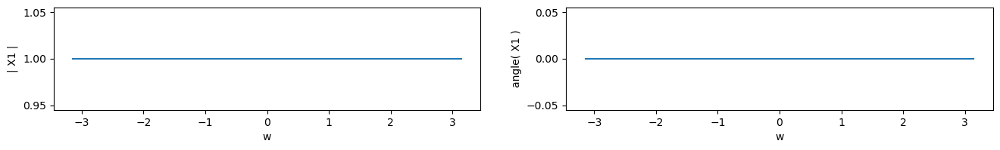

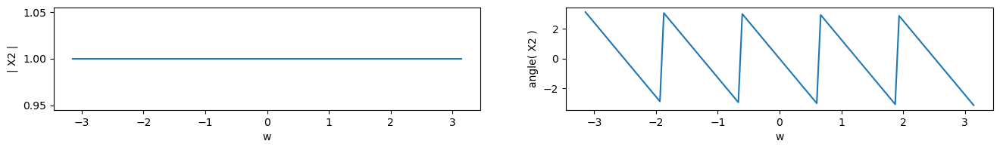

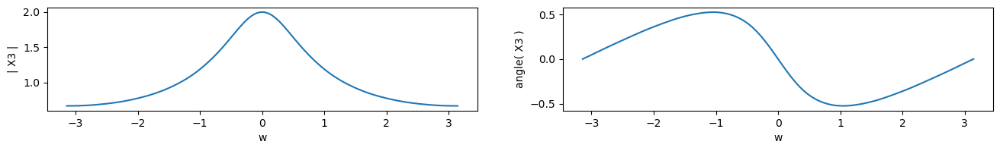

In [73]:
w=np.linspace(-np.pi,np.pi,100)
x1=np.zeros(21)
x1[10]=1
X1= DTFT(x1,-10,w)
plt.subplot(3,2,1)
plt.plot(w,np.abs(X1))
plt.xlabel("w")
plt.ylabel("| X1 |")
plt.subplot(3,2,2)
plt.plot(w,np.angle(X1))
plt.xlabel("w")
plt.ylabel("angle( X1 )")
plt.show()


x2=np.zeros(21)
x2[15]=1
X2=DTFT(x2,-10,w)
plt.subplot(3,2,3)
plt.plot(w,np.abs(X2))
plt.xlabel("w")
plt.ylabel("| X2 |")
plt.subplot(3,2,4)
plt.plot(w,np.angle(X2))
plt.xlabel("w")
plt.ylabel("angle( X2 )")
plt.show()

n=np.arange(0,21,1)
x3=np.zeros(len(n))
for i in n:
    if i >= 10:
        x3[i]=np.power(0.5,i-10)*1
X3=DTFT(x3,-10,w)
plt.subplot(3,2,5)
plt.plot(w,np.abs(X3))
plt.xlabel("w")
plt.ylabel("| X3 |")
plt.subplot(3,2,6)
plt.plot(w,np.angle(X3))
plt.xlabel("w")
plt.ylabel("angle( X3 )")
plt.show()

<h3 style="color:red;"><left>Exercise 5.2: Magnitude and Phase of the Frequency Response of a Discrete-Time Systems</left></h3>

Consider the discrete-time system described by the following difference equation:

\begin{equation}y[n]=0.9y[n-1]+0.3x[n]+0.24x[n-1]\end{equation}

Assume that the system is **causal**.

**1. Draw a system diagram.**

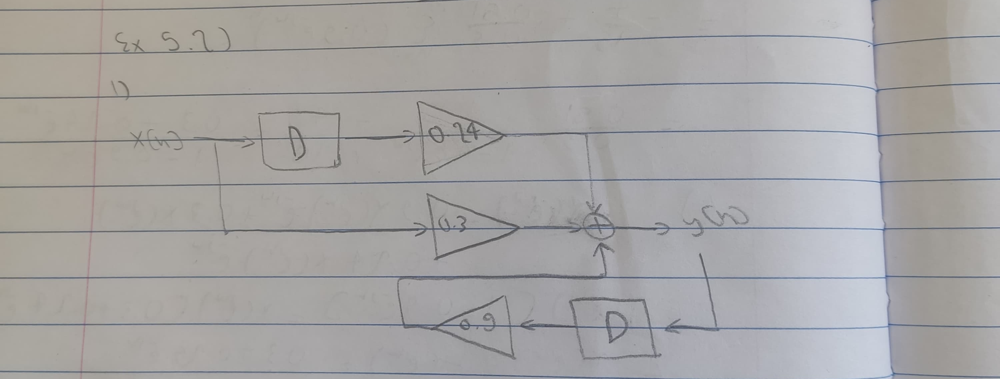

**2. Obtain the impulse response of the system by replacing $x[n]$ with $\delta[n]$ in the above equation. (Use causality to set up the initial conditions.)**

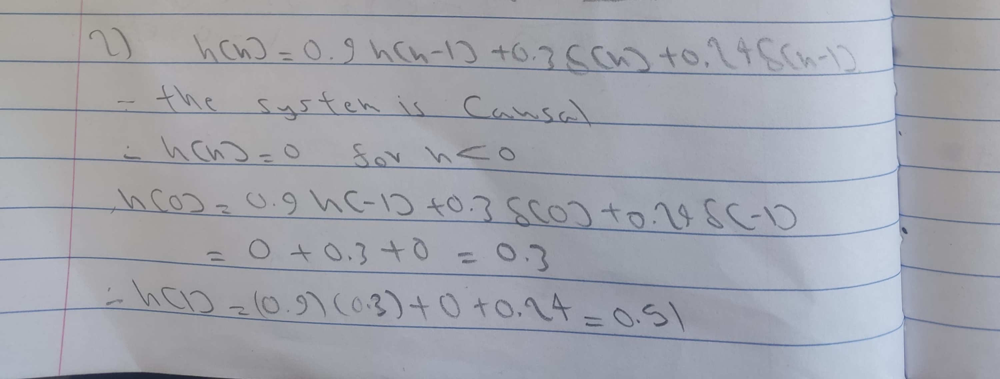 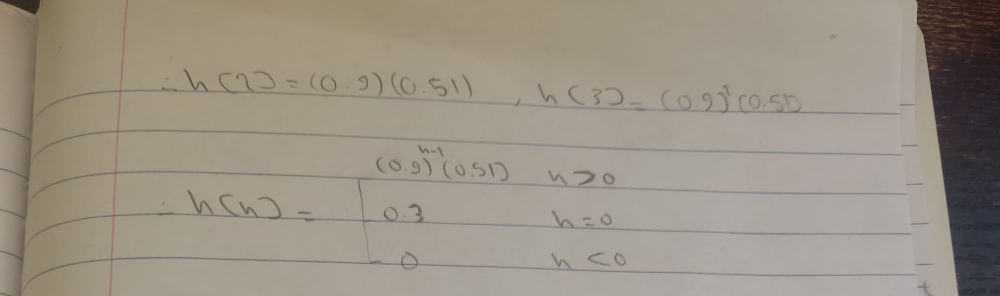

**3. Use your answer in Q2 to obtain the frequency response of the system.**

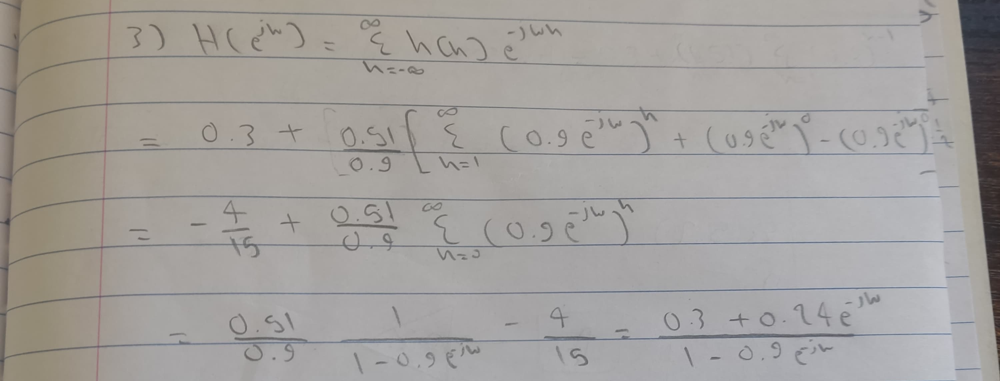

**4. Find the frequency response of the system using another method. Specifically, take the DTFT of the left-hand-side and right-hand-side of the difference equation, and then use linearity and the time-shifting property of the DTFT along with the fact that $H(\omega)=\frac{Y(\omega)}{X(\omega)}$**

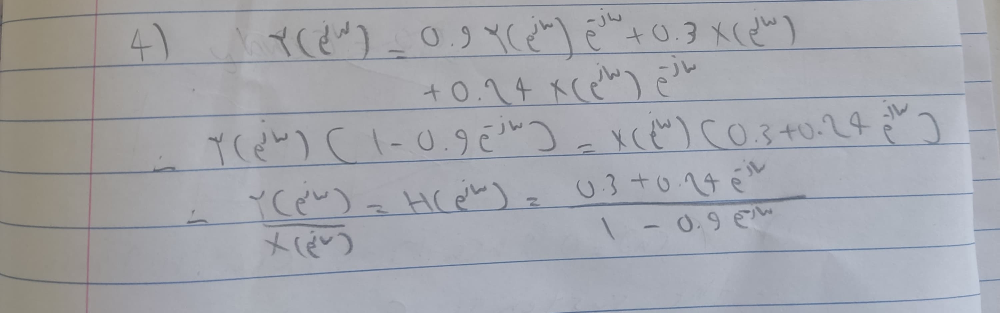

**5. Write Python code to compute and plot the magnitude and phase responses, $|H(\omega)|$ and $\angle H(\omega)$, for $-\pi<\omega<\pi$.**

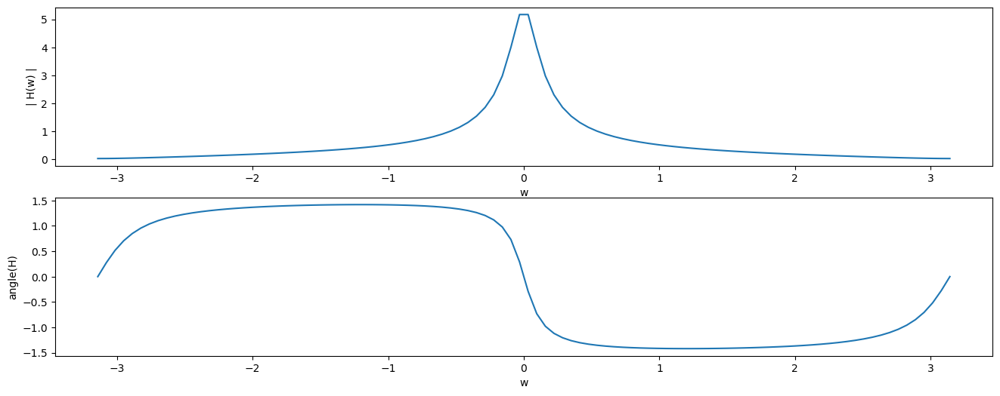

In [92]:
H1=(0.3+0.24*np.exp(-1j*w))/(1-0.9*np.exp(-1j*w))
plt.subplot(2,1,1)
plt.plot(w,np.abs(H1))
plt.xlabel("w")
plt.ylabel("| H(w) |")
plt.subplot(2,1,2)
plt.plot(w,np.angle(H1))
plt.xlabel("w")
plt.ylabel("angle(H)")
plt.show()

<h3 style="color:red;"><left>Exercise 5.3</left></h3>

**1. Insert the printout of your completed block diagram.**

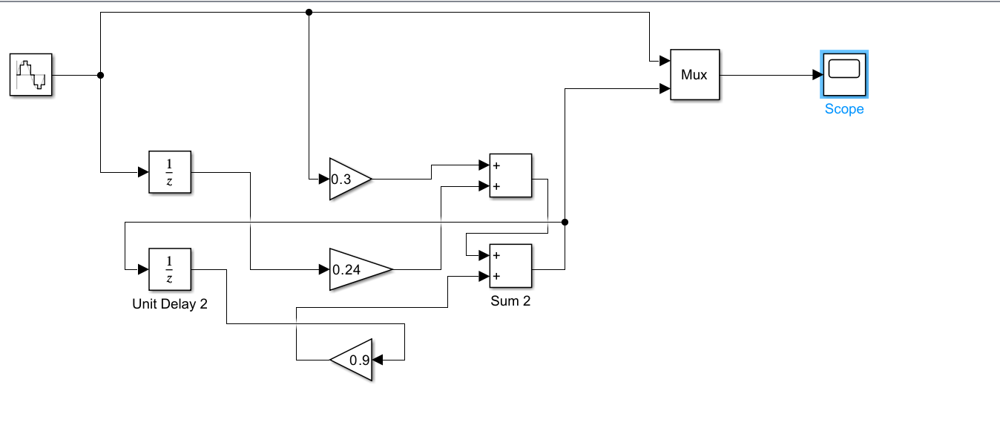

**2. Enter both the amplitude measurements you made and their theoretical values.**

| $\omega$ | Measurements | Theoretical Values |
|:--------:|:------------:|:------------------:|
| $\pi/16$ |   $2.555$    |       $2.545$      |
|  $\pi/8$ |   $1.377$    |       $1.381$      |
|  $\pi/4$ |   $0.706$    |       $0.681$      |

**3. Plot the impulse response, and the magnitude and phase of the frequency response by using your DTFT function.**

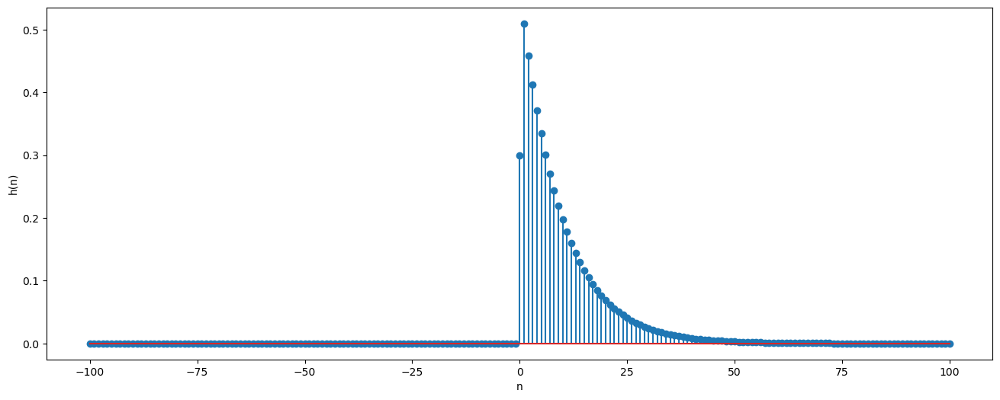

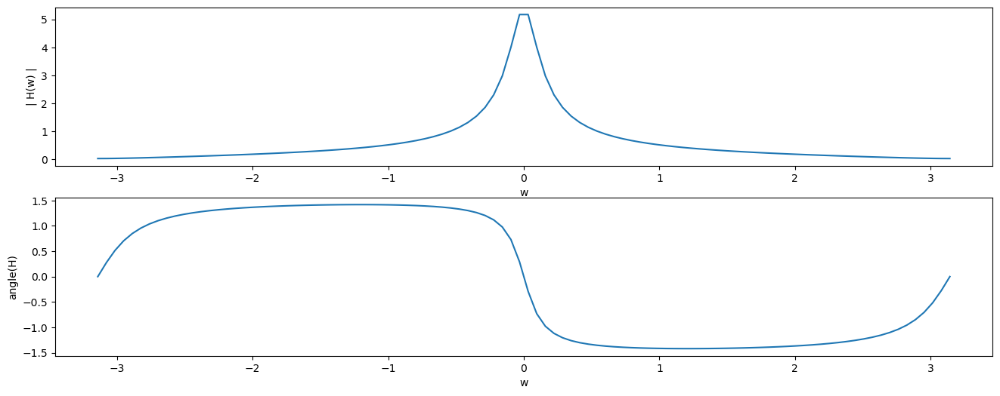

In [98]:
n=np.arange(-100,101,1)
h=np.zeros(201)
h[100]=0.3
for i in np.arange(101,201,1):
    h[i]=(0.51)*np.power(0.9,i-101)
H=DTFT(h,-100,w)
plt.figure()
plt.stem(n,h)
plt.xlabel("n")
plt.ylabel("h(n)")
plt.figure()
plt.subplot(2,1,1)
plt.plot(w,np.abs(H))
plt.xlabel("w")
plt.ylabel("| H(w) |")
plt.subplot(2,1,2)
plt.plot(w,np.angle(H))
plt.xlabel("w")
plt.ylabel("angle(H)")
plt.show()